**Lab 6: IIR Filtering**


The objective for this lab is to help you understand the relationship between the location
of poles and zeros in the z-domain, the impulse response h[n] in the n-domain, and the frequency
response $H(e^{j\omega})$. We use the system function,
represented as a ratio of polynomials in $z^{-1}$, which can be expressed in either factored or expanded form as:

$$
H(z) = G\frac{\prod_{k=1}^M (1-z_kz^{-1}) }{\prod_{k=1}^N (1-p_kz^{-1})} = \frac{ \sum_{k=0}^M b_kz^{-k}}{ 1- \sum_{k=1}^N a_kz^{-k} }
$$

In [1]:
import numpy as np
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from util import load_audio, plot_signals, plot_spectrogram, plot_frequency_response

**1. IIR filters to extract the envelope**

In the previous labs, you extracted the envelope from your reference signal by applying the following system:

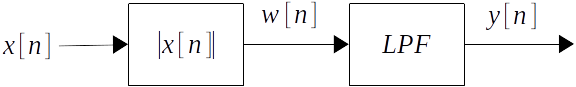

where $w[n] = |x[n]|$ and $y[n]$ was the output of a low-pass FIR filter (averaging filter). In this exercise, you will re-implement this low-pass filter as an IIR.

1.1 First, copy the functions envelope and synthesize from previous work and obtain the same synthesis. 



In [ ]:
# Write your code here
!git clone https://github.com/guillemmarti06/sis1_group103.git 
filepath = "./sis1_group103/audio_la.wav"
ref, fs = load_audio(filepath)

def envelope(x, N):
    x_rect = np.abs(x)
    kernel = np.ones(N) / N
    y = np.convolve(x_rect, kernel, 'same')

    return y, kernel

def synthesize(f0, phi, Ak, t):
    y = 0
    for k in range(1, len(Ak) + 1):
        y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
    return y
# From previous labs...
weights = [1, 0.4522836, 0.1879079, 0.2577941, 0.3784587, 0.06882009] 
phi = np.pi / 2
f0 = 440
fs = 44100
T = 1 / f0

# Generate the synthesized sinusoidal signal 
t = np.arange(0, len(ref) / fs, 1 / fs)
y = synthesize(f0, phi, weights, t)
y_syn = np.max(np.abs(ref)) * y / np.max(np.abs(y))

env, _ = envelope(ref, 5)
env = env / np.max(env)
syn = y_syn * env   # Now syn is the synthesis obtained from lab 4 after the multiplication 

1.2 Let's take a look at the following system:

$$
H(z) = G\frac{1+z^{-1}}{1-rz^{-1}} \quad   0<r<1 \quad, G = \frac{1-r}{2}
$$

Note that the coefficients of the filter are the following:

$$
b_0 = 1, \quad b_1 = 1, \quad a_0 = 1, \quad a_1 = -r, \quad
$$

i. Find the zeros and poles of the system analytically.

The system has a zero in z = -1 and a pole in z = r

ii. Use the function `np.roots` to find the zeros and poles using Python. Compare the results with part i.

In [15]:
# Write your code here
r= 0.1
G = (1 - r) / 2
b = [1, 1]   
a = [1, -r] 
zeros = np.roots(b)
poles = np.roots(a)
print(f"\nFor r = {r}:")
print(f"Analytical: Zero at -1, Pole at {r}")
print(f"Python: Zero at {zeros[0]:.1f}, Pole at {poles[0]:.1f}")
print(f"Gain G = {G:.2f}")


For r = 0.1:
Analytical: Zero at -1, Pole at 0.1
Python: Zero at -1.0, Pole at 0.1
Gain G = 0.45


iii. Use the function  `plot_zeros_poles(z, p)` to plot the zeros and poles found in ii.

In [7]:
# Write your code here
from util import plot_zeros_poles
plot_zeros_poles(zeros, poles)

1.3 Let's see the frequency response of this filter:



In [5]:
# Write your code here
from util import plot_frequency_response

w = np.linspace(-np.pi, np.pi, 1000)
W, H = signal.freqz(b, a, worN = w)

plot_frequency_response(w, H)


1.4. Change the parameter $r$ in the range $(0, 1)$. What happens when $r$ is increased?

As we can see, with this increment, the zero stays in the same position (-1,0), but the pole increases as r increses (because pole at z = r) and we can see now it is approaching 1. L'ets compute it all again to see the difference:

In [17]:
# Write your code here
r= 0.9
G = (1 - r) / 2
b = [1, 1]   
a = [1, -r] 
zeros = np.roots(b)
poles = np.roots(a)
print(f"Analytical: Zero at -1, Pole at {r}")
print(f"Zero at {zeros[0]:.1f}, Pole at {poles[0]:.1f}")
print(f"G = {G:.2f}")

Analytical: Zero at -1, Pole at 0.9
Zero at -1.0, Pole at 0.9
G = 0.05


In [9]:
plot_zeros_poles(zeros, poles)

1.5 What type of filter is (low-pass, band-pass, or high-pass filter)?


As we can see, it is a low-pass filter. There are only shown those frequencies close to the fundamental.

1.6 Now we can use this IIR filter to extract the envelope. Let's define a new function `envelope_iir(x)` that applies the filter to the absolute value of the signal. Note that we are using signal.lfilter function to apply the filter.


In [29]:
def envelope_iir(x, r=0.995):
    rectified_signal = np.abs(x)
    G = (1 - r) / 2
    b = [G,G]
    a = [1, -r] 
    y = signal.lfilter(b, a, rectified_signal)
    return y

Extract the envelope of your reference signal using both the FIR and IIR filters and compare the results plot them along with the signal. Change the value of $r$ until you are comfortable with the result.

In [31]:
# Write your code here
env_fir, _ = envelope(ref, N = 1000)
env_iir = envelope_iir(ref, r=0.995)
t_start = 0.0
t_end = -1

plot_signals([ref, env_fir, env_iir], fs, t_start = t_start, t_end = t_end, name=['ref','FIR envelope', f'IIR Envelope (r={r})'], mode='lines')

1.7 What are the main differences between the two filters? For instance, compare the number of coefficients.

We can see that the IIR envelope is more smooth, and with only one pick at the beggining. Fir has finite impulse response, while the IIR goes to infinite.

1.8 Apply the new envelope (extracted from the IIR filter) to the synthesis generated with the `synthesize` function and listen to the result.

In [49]:
envelope_iir_signal = env_iir / np.max(env_iir)
y = synthesize(f0, phi, weights, t)
y_env_iir = y * envelope_iir_signal

ipd.display(ipd.Audio(ref, rate=fs))
ipd.display(ipd.Audio(y_env_iir, rate=fs))

plot_signals([ref, y_env_iir], fs, t_start = t_start, t_end = t_end, name=['ref', f'y syn * IIR Envelope (r={r})'], mode='lines')

---

**2. Band-pass filters**

Now let's work with the following system: 

$$
H(z) = \frac{(1-z^{-1})(1+z^{-1})}{(1-re^{j\omega_n}z^{-1})(1-re^{-j\omega_n}z^{-1})}, \quad 0<r<1
$$

Note that the poles are $p_1 = re^{j\omega_n}$ and $p_2 = re^{-j\omega_n}$; and the zeros are $z_1=1$ and $z_2=-1$. 

2.1 Use the function `plot_zeros_poles` to plot the zeros and poles of the system.

Note: use $w_n = \pi/4$ and $r=0.99$.

In [33]:
# Write your code here
w_n = np.pi/4 
r= 0.99
zeros = [1, -1]
poles = [r * np.exp(1j * w_n), r * np.exp(-1j * w_n)]
plot_zeros_poles(zeros, poles)

2.2 Show analytically that $a_k = [1, -2rcos(\omega_n), r^2]$ and $b_k=[1, 0, -1]$.

The numerator is: (1 - z^{-1})(1 + z^{-1}) = 1 - z^{-2} ` --> ` b_k = [1, 0, -1]

The denominator is: (1 - re^{jω_n}z^{-1})(1 - re^{-jω_n}z^{-1}) = 1 - 2rcos(ω_n)z^{-1} + r²z^{-2} ` --> ` a_k = [1, -2rcos(ω_n), r²]

2.3 Plot the frequency response of the filter. Confirm this is a band-pass filter. What's the central frequency of the passband?

In [36]:
# Write your code here
from util import plot_frequency_response

b = [1,0,-1]
a = [1, -2 * r * np.cos(w_n), r **2]
w = np.linspace(-np.pi, np.pi, 1000)
W, H = signal.freqz(b, a,  worN = w)

plot_frequency_response(w, H)

[Double click to write your answer]


2.4 Define a function `bpf(x, f, r, fs)` that applies the above band-pass filter. 

Note 1: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$.

Note 2: use `signal.lfilter` function to implement the filter.

In [ ]:
def bpf(x, fn, fs, r=0.995):
  """Applies a band-pass filter with central frequency fn

  Parameters
  ----------
  x : np.array
      The input signal in the form of a numpy array
  fn: int or float
      Central frequency of the band pass in Hz 
  fs : int or float
      Frequency rate in Hz
  r: float
      Magnitude of the poles

  Returns
  -------
  y : np.array
      The output of the filter

  """
  # Write your code here
  # recall values of a and b
  w_n = 2 * np.pi * fn / fs  
  b = [1, 0, -1]  # numerator
  a = [1, -2 * r * np.cos(w_n), r**2]  # denominator 
  y = signal.lfilter(b, a, x)
  return y

2.5 Regardless of the phase, until now we were synthesizing the instrument signal by summing $K$ harmonics of the signal with different weights ($A_k$) and multiplying the sum by the envelope of the reference signal ($e(t)$):

$$y(t) = e(t) \cdot \sum_{k=1}^K A_k\cos\left(2\pi kf_0 t \right), $$

where $f_0$ is the fundamental frequency of the note. Now we want to improve this synthesis by finding a time-dependent amplitude ($A_k(t)$) for each harmonic:

$$y(t) = \sum_{k=1}^K A_k(t) \cos\left(2\pi kf_0 t \right), $$

where $A_k(t)$ is the amplitude of the harmonic $k$. To extract the amplitudes $A_k(t)$ we'll apply a band-pass filter with central frequency $kf_0$ and calculate the envelope of the output by using the `envelope_iir`.


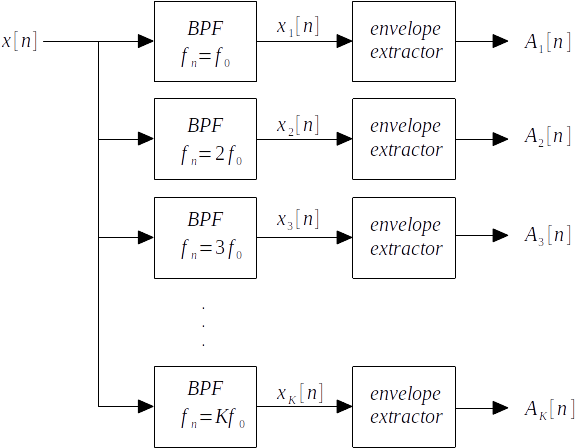

For instance, the following code should extract the envelope of the fundamental frequency component. Change the value of $f_0$ to coincide with your fundamental frequency and check the result. 

In [50]:
# Write your code here
y_f0 = bpf(y_env_iir, f0, fs, r = 0.995)
print(y_f0)

env_f0 = envelope_iir(y_f0, r = 0.995)
plot_signals([ref, y_f0, env_f0], fs, t_start = 0.0, t_end = -1, name = ['REF', 'BFP output', 'Envelope of BFP output'])

[ 8.93860362e-21 -6.31979279e-05 -3.22131930e-04 ... -1.54789784e+00
 -1.97882979e+00 -2.40512607e+00]


2.6 Complete the `synthetize_with_bpf` function to implement a synthesis applying different envelopes for each harmonic.


In [ ]:
def synthetize_with_bpf(x, f0, phi, K, fs):
  """Synthetizes an harmonic signal using different envelopes for each harmonic
  The envelops are extracted from the reference signal x.

  Parameters
  ----------
  x : np.array
      The reference signal in the form of a numpy array
  f0: int or float
      Fundamental frequency of the synthesis
  phi : float
      Phase
  K: int
      Number of harmonics
  fs : int or float
      Frequency rate in Hz

  Returns
  -------
  y : np.array
      The output of the filter

  """
  # Write your code here
  N = len(x)
  t = np.arange(N) / fs
  y = np.zeros(N)
    
  for k in range(1, K + 1):
    harmonic_component = bpf(x, k * f0, fs)
        
    A_k_t = envelope_iir(harmonic_component)
        
    harmonic_signal = A_k_t * np.cos(2 * np.pi * k * f0 * t + phi)
        
    y += harmonic_signal
    
  return y

2.6 Call the function `synthetize_with_bpf` to get the synthesized signal and **listen to it**.

Note that now you can increase the number of harmonics $K$ as you want because we are not manually measuring the weights of each harmonic.

In [52]:
# Write your code here
K = 15
y_bpf = synthetize_with_bpf(ref, f0, phi, K, fs)
y_bpf = np.max(np.abs(ref)) * y_bpf / np.max(np.abs(y_bpf))

print("BPF synthesis with K =", K, "harmonics:")
ipd.display(ipd.Audio(y_bpf, rate=fs))

BPF synthesis with K = 15 harmonics:


2.7 Compare the **spectrograms** of the synthesized signal and reference signal.

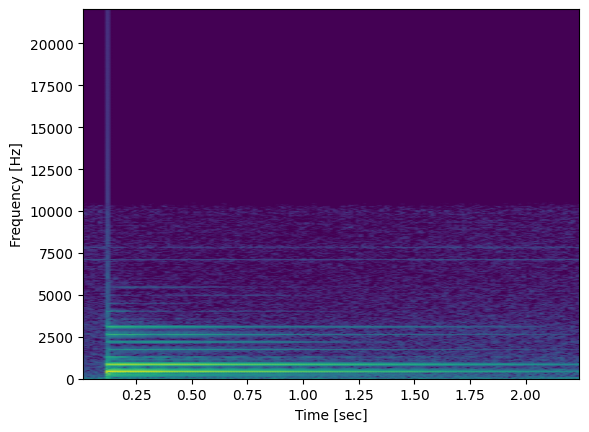

In [53]:
from scipy import signal

ff, tt, S = signal.spectrogram(ref, fs=fs, nperseg=1024, noverlap=512)
plot_spectrogram(ff, tt, S)

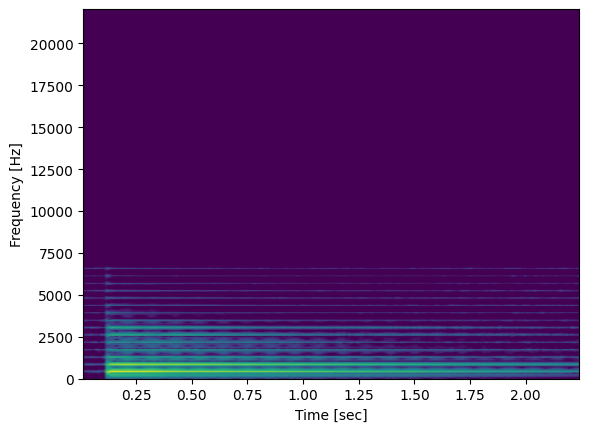

In [55]:
ff, tt, S = signal.spectrogram(y_bpf, fs=fs, nperseg=1024, noverlap=512)
plot_spectrogram(ff, tt, S)